# Tugas Pertemuan 11 | Tugas Mandiri

**Nama: Reva Aulia Faradilah**

**NIM: 0110222145**

**Kelas: ML Pagi - 2022**

---

# 1. Import Library

In [1]:
!pip install pandas numpy scikit-learn matplotlib seaborn

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns

from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

In [3]:
!pip install folium
import folium
from folium.plugins import MarkerCluster

# 2. Baca File CSV

In [4]:
# Menghubungkan dengan Google Drive
from google.colab import drive
drive.mount('/content/gdrive')
import os

# Memanggil dataset melalui gdrive
path = "gdrive/MyDrive/MachineLearning/praktikum11/data/"

# Membaca file csv
df = pd.read_csv(path + 'data_wisata_bogor_final.csv')
df

Mounted at /content/gdrive


,nama_tempat_wisata,kategori,preferensi,kecamatan,kabupaten_kota,rating,jumlah_rating,harga_tiket,link,latitude,longitude,link_gambar
0,Kolam renang pancar,Rekreasi,Wisata Rekreasi,Babakan Madang,Kabupaten Bogor,4.2,58.0,NaN,https://www.google.com/maps/place/Kolam+renang...,-6.574515,106.912986,https://lh3.googleusercontent.com/gps-cs-s/AG0...
1,Wisata Edukasi TK SD di Bogor,Budaya,Wisata Budaya & Edukasi,Babakan Madang,Kabupaten Bogor,4.9,1615.0,NaN,https://www.google.com/maps/place/Wisata+Eduka...,-6.575724,106.840356,https://lh3.googleusercontent.com/p/AF1QipP9Ol...
2,Curug Cibaliung Jonggol,Alam,Wisata Alam,Babakan Madang,Kabupaten Bogor,4.6,749.0,NaN,https://www.google.com/maps/place/Curug+Cibali...,-6.599597,106.958568,https://lh3.googleusercontent.com/p/AF1QipOvrJ...
3,Gunung Pancar Tour Wisata Hot Spring Water,Alam,Wisata Alam,Babakan Madang,Kabupaten Bogor,3.6,506.0,NaN,https://www.google.com/maps/place/Gunung+Panca...,-6.580854,106.904627,https://lh3.googleusercontent.com/gps-cs-s/AG0...
4,Wisata Bukit Domba,Alam,Wisata Alam,Babakan Madang,Kabupaten Bogor,4.6,476.0,NaN,https://www.google.com/maps/place/Wisata+Bukit...,-6.624837,106.906346,https://lh3.googleusercontent.com/gps-cs-s/AG0...
...,...,...,...,...,...,...,...,...,...,...,...,...
2837,Museum Tanah dan Pertanian,Budaya,Wisata Budaya & Edukasi,Tanah Sareal,Kota Bogor,4.7,788.0,NaN,https://www.google.com/maps/place/Museum+Tanah...,-6.603703,106.797868,https://lh3.googleusercontent.com/gps-cs-s/AG0...
2838,Air Terjun Curug Nangka,Alam,Wisata Alam,Tanah Sareal,Kota Bogor,4.3,7509.0,NaN,https://www.google.com/maps/place/Air+Terjun+C...,-6.669066,106.726407,https://lh3.googleusercontent.com/gps-cs-s/AG0...
2839,Taman Kaulinan,Alam,Wisata Alam,Tanah Sareal,Kota Bogor,4.6,1997.0,NaN,https://www.google.com/maps/place/Taman+Kaulin...,-6.592158,106.800309,https://lh3.googleusercontent.com/gps-cs-s/AG0...
2840,Taman Peranginan,Alam,Wisata Alam,Tanah Sareal,Kota Bogor,4.5,1639.0,NaN,https://www.google.com/maps/place/Taman+Perang...,-6.586952,106.797167,https://lh3.googleusercontent.com/gps-cs-s/AG0...


# 3. Menampilkan Informasi Umum

In [5]:
# Menampilkan informasi detail dengan df.info()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2842 entries, 0 to 2841
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   nama_tempat_wisata  2842 non-null   object 
 1   kategori            2842 non-null   object 
 2   preferensi          2842 non-null   object 
 3   kecamatan           2842 non-null   object 
 4   kabupaten_kota      2842 non-null   object 
 5   rating              2779 non-null   float64
 6   jumlah_rating       2779 non-null   float64
 7   harga_tiket         0 non-null      float64
 8   link                2842 non-null   object 
 9   latitude            2842 non-null   float64
 10  longitude           2842 non-null   float64
 11  link_gambar         2585 non-null   object 
dtypes: float64(5), object(7)
memory usage: 266.6+ KB


# 4. Cek Struktur Data

In [7]:
df[['latitude', 'longitude']].describe()

,latitude,longitude
count,2842.000000,2842.000000
mean,-6.568873,106.799231
std,0.099911,0.140577
min,-6.887042,106.046521
25%,-6.648722,106.696630
50%,-6.580649,106.796937
75%,-6.488876,106.904573
max,-6.214557,107.797893


In [8]:
df[['latitude', 'longitude']].isna().sum()

,0
latitude,0
longitude,0


# 5. Seleksi data yang punya koordinat lengkap

In [9]:
df_geo = df[['nama_tempat_wisata',
             'kategori',
             'kecamatan',
             'kabupaten_kota',
             'latitude',
             'longitude']].copy()

# Buang baris yang tidak punya koordinat
df_geo = df_geo.dropna(subset=['latitude', 'longitude'])

In [10]:
# Cek jumlah baris setelah dibersihkan
df_geo.shape

(2842, 6)

# 6. Visualisasi sebaran titik GPS (sebelum clustering)

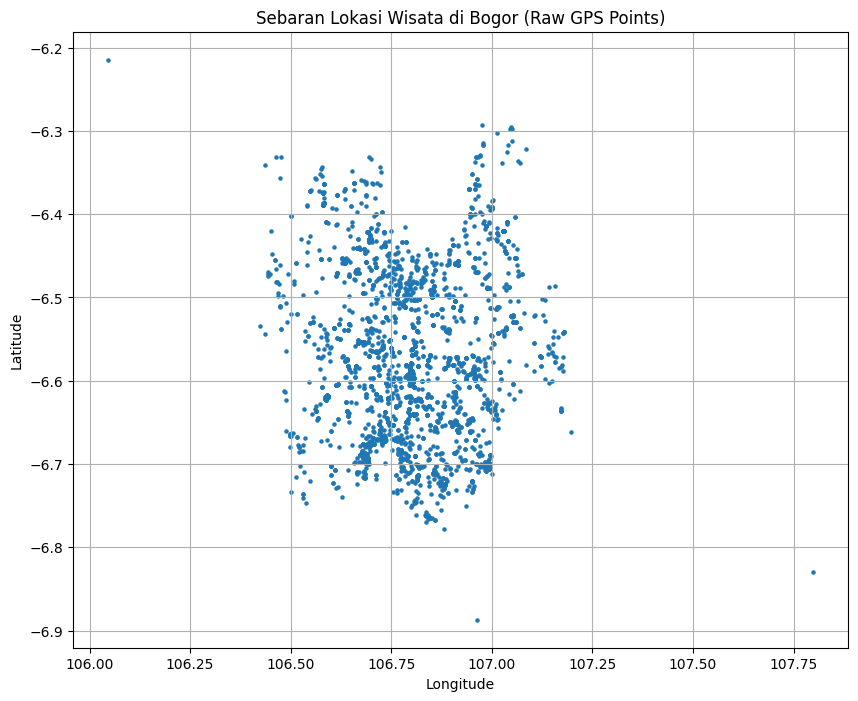

In [12]:
plt.figure(figsize=(10, 8))
plt.scatter(df_geo['longitude'], df_geo['latitude'], s=5)
plt.title("Sebaran Lokasi Wisata di Bogor (Raw GPS Points)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.show()

# 7. Menentukan fitur untuk DBSCAN (GPS)

In [13]:
coords = df_geo[['latitude', 'longitude']].to_numpy()
coords_rad = np.radians(coords)  # ubah derajat ke radian
coords_rad[:5]

array([[-0.11474693,  1.86598362],
       [-0.11476803,  1.86471598],
       [-0.1151847 ,  1.86677918],
       [-0.11485757,  1.86583772],
       [-0.11562521,  1.86586772]])

# 8. Cari nilai eps dengan k-distance plot

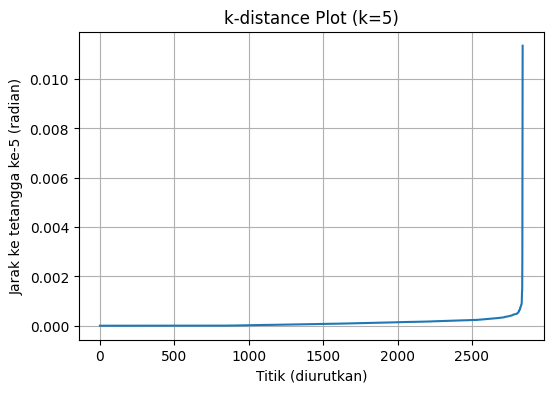

In [14]:
# Pilih k = min_samples (misal 5)
k = 5

neighbors = NearestNeighbors(n_neighbors=k, metric='haversine')
neighbors_fit = neighbors.fit(coords_rad)
distances, indices = neighbors_fit.kneighbors(coords_rad)

# ambil jarak ke tetangga ke-k (index k-1)
k_distances = np.sort(distances[:, k-1])

plt.figure(figsize=(6,4))
plt.plot(k_distances)
plt.title(f"k-distance Plot (k={k})")
plt.xlabel("Titik (diurutkan)")
plt.ylabel("Jarak ke tetangga ke-5 (radian)")
plt.grid(True)
plt.show()

# 9. Jalankan DBSCAN (dengan haversine)

In [15]:
eps_km = 1.0          # radius 1 km
eps = eps_km / 6371.0 # konversi km ke radian (untuk haversine)

dbscan = DBSCAN(
    eps=eps,
    min_samples=5,
    metric='haversine'
)

labels = dbscan.fit_predict(coords_rad)

# simpan ke dataframe
df_geo['cluster'] = labels
df_geo['cluster'].value_counts().head(10)

,count
cluster,
-1,564
37,196
92,159
12,130
70,71
75,61
42,52
49,48
50,47


In [16]:
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = (labels == -1).sum()

print("Jumlah cluster (tidak termasuk noise):", n_clusters)
print("Jumlah titik noise (label = -1):", n_noise)

Jumlah cluster (tidak termasuk noise): 125
Jumlah titik noise (label = -1): 564


# 10. Visualisasi hasil cluster DBSCAN

**Scatter plot cluster (2D)**

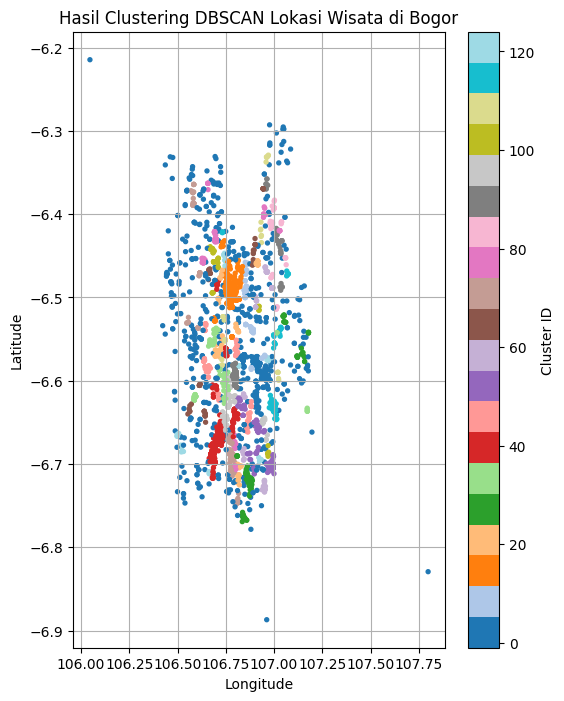

In [17]:
plt.figure(figsize=(6, 8))
scatter = plt.scatter(
    df_geo['longitude'],
    df_geo['latitude'],
    c=df_geo['cluster'],
    s=8,
    cmap='tab20'
)
plt.title("Hasil Clustering DBSCAN Lokasi Wisata di Bogor")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.colorbar(scatter, label='Cluster ID')
plt.show()

**Rekap cluster terbesar (densitas tertinggi)**

In [18]:
cluster_counts = df_geo['cluster'].value_counts()

# buang noise (-1)
cluster_counts = cluster_counts[cluster_counts.index != -1]

cluster_counts.head(10)

,count
cluster,
37,196
92,159
12,130
70,71
75,61
42,52
49,48
50,47
2,45


In [19]:
# Lihat komposisi per kecamatan untuk beberapa cluster terbesar
top_clusters = cluster_counts.head(3).index.tolist()
top_clusters

[37, 92, 12]

In [20]:
for c in top_clusters:
    print(f"\nCluster {c}")
    display(
        df_geo[df_geo['cluster'] == c]['kecamatan'].value_counts().head(10)
    )


Cluster 37


,count
kecamatan,
Pamijahan,61
Tenjolaya,56
Tamansari,28
Cibungbulang,10
Ciomas,9
Dramaga,7
Ciampea,7
Bogor Barat,3
Bogor Tengah,2



Cluster 92


,count
kecamatan,
Bogor Tengah,42
Bogor Barat,25
Bogor Utara,25
Bogor Selatan,20
Bogor Timur,18
Tanah Sareal,11
Ciomas,8
Sukaraja,5
Dramaga,3



Cluster 12


,count
kecamatan,
Bojonggede,48
Tajurhalang,43
Kemang,14
Cibinong,6
Sukaraja,5
Citeureup,3
Bogor Utara,2
Bogor Barat,2
Ciomas,2


# 11. Visualisasi Peta

In [21]:
center_lat = df_geo['latitude'].mean()
center_lon = df_geo['longitude'].mean()

center_lat, center_lon

(np.float64(-6.568872549507389), np.float64(106.79923132723434))

In [22]:
m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=11,
    tiles="OpenStreetMap"
)

In [23]:
# Ambil daftar cluster unik
clusters = sorted(df_geo['cluster'].unique())

# Definisikan daftar warna dasar
base_colors = [
    "red", "blue", "green", "purple", "orange", "darkred",
    "lightred", "beige", "darkblue", "darkgreen", "cadetblue",
    "darkpurple", "white", "pink", "lightblue", "lightgreen",
    "gray", "black", "lightgray"
]

def get_cluster_color(cluster_id):
    if cluster_id == -1:
        return "gray"  # noise
    # geser indeks supaya tidak bentrok dengan -1
    idx = int(cluster_id) % len(base_colors)
    return base_colors[idx]

In [25]:
for _, row in df_geo.iterrows():
    lat = row['latitude']
    lon = row['longitude']
    cl  = row['cluster']

    # teks popup
    popup_text = (
        f"<b>{row.get('nama_tempat_wisata', 'Nama tidak tersedia')}</b><br>"
        f"Kecamatan : {row.get('kecamatan', '-')}"
        f"<br>Kab/Kota : {row.get('kabupaten_kota', '-')}"
        f"<br>Cluster DBSCAN : {cl}"
    )

    folium.CircleMarker(
        location=[lat, lon],
        radius=4,
        popup=folium.Popup(popup_text, max_width=250),
        color=get_cluster_color(cl),
        fill=True,
        fill_opacity=0.7
    ).add_to(m)

m